# Analise Dados Covid-19

## Esse projeto trás análise de dados do início da covid-19

In [5]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns 
import matplotlib.pyplot as plt
import scipy as sc
import bar_chart_race as bcr
from IPython.display import HTML,display
import warnings
warnings.filterwarnings("ignore")

df = pd.read_csv("imports/full_grouped.csv")


### Checando os dados

In [6]:
df.head()

,Data,País,Confirmados,Mortes,Recuperados,Ativos,Novos Casos,Novas Mortes,Novos Recuperados,Região WHO
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa


## Preparando o Dataset

### Checando se existem dados nulos

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Data               35156 non-null  object
 1   País               35156 non-null  object
 2   Confirmados        35156 non-null  int64 
 3   Mortes             35156 non-null  int64 
 4   Recuperados        35156 non-null  int64 
 5   Ativos             35156 non-null  int64 
 6   Novos Casos        35156 non-null  int64 
 7   Novas Mortes       35156 non-null  int64 
 8   Novos Recuperados  35156 non-null  int64 
 9   Região WHO         35156 non-null  object
dtypes: int64(7), object(3)
memory usage: 2.7+ MB


In [8]:
df.isnull().sum()

Data                 0
País                 0
Confirmados          0
Mortes               0
Recuperados          0
Ativos               0
Novos Casos          0
Novas Mortes         0
Novos Recuperados    0
Região WHO           0
dtype: int64

In [9]:
df.describe()

,Confirmados,Mortes,Recuperados,Ativos,Novos Casos,Novas Mortes,Novos Recuperados
count,3.515600e+04,35156.000000,3.515600e+04,3.515600e+04,35156.00000,35156.000000,35156.000000
mean,2.356663e+04,1234.068239,1.104813e+04,1.128443e+04,469.36375,18.603339,269.315593
std,1.499818e+05,7437.238354,6.454640e+04,8.997149e+04,3005.86754,115.706351,2068.063852
min,0.000000e+00,0.000000,0.000000e+00,-2.000000e+00,0.00000,-1918.000000,-16298.000000
25%,1.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.00000,0.000000,0.000000
50%,2.500000e+02,4.000000,3.300000e+01,8.500000e+01,2.00000,0.000000,0.000000
75%,3.640250e+03,78.250000,1.286250e+03,1.454000e+03,75.00000,1.000000,20.000000
max,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06,77255.00000,3887.000000,140050.000000


## Analizando mortes de Covid-19 (de 22/01/2020 a 27/07/2020) por data para cada país usando bar_chart_race

In [10]:
df_full_mortes = df.pivot(index='Data', columns = 'País', values = 'Mortes')
df_mortes = df_full_mortes.fillna(df_full_mortes.mean())
df_mortes

País,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
Data,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-23,1211,123,1124,52,33,3,2702,688,139,711,...,45639,34,103,129,0,67,1,461,134,28
2020-07-24,1225,128,1136,52,35,3,2807,692,145,711,...,45762,34,106,134,0,70,1,469,136,32
2020-07-25,1248,134,1146,52,39,3,2893,700,155,712,...,45823,34,111,138,0,75,1,474,139,34


### Animação com número de mortes de Covid-19 por país/dia

In [11]:
df_mortes_simplificada = df_mortes.iloc[::2]
bcr.bar_chart_race(df=df_mortes_simplificada,
                              filename=None,
                              orientation='h',
                              sort='desc',
                              n_bars=10,
                              label_bars=True,
                              steps_per_period=10,
                              period_length=500,
                              figsize=(5, 3),
                              cmap='dark24',
                              title='Mortes por Covid-19 de 22/01/2020 a 27/07/2020',
                              bar_label_size=8,
                              tick_label_size=7,
                              fig=None)

## Analisando Casos confirmados de Covid-19 por data e para cada país

In [12]:
df_full_confirmados = df.pivot(index='Data', columns = 'País', values = 'Confirmados')
df_confirmados = df_full_confirmados.fillna(df_full_confirmados.mean())
df_confirmados

País,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
Data,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,4,0,...,0,0,0,0,2,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-23,35928,4466,25484,889,851,76,148027,36162,13595,20099,...,298731,1141,18986,13613,412,9744,10,1654,3789,2124
2020-07-24,35981,4570,26159,897,880,82,153520,36613,13950,20214,...,299500,1166,19360,14263,415,10093,10,1674,3856,2296
2020-07-25,36036,4637,26764,897,916,82,158334,36996,14403,20338,...,300270,1174,19952,14929,417,10306,10,1674,4328,2434


### Animação com número de casos confirmados de Covid-19 por país/dia

In [13]:
df_confirmados_simplificada = df_confirmados.iloc[::2]
bcr.bar_chart_race(df=df_confirmados_simplificada,
                              filename=None,
                              orientation='h',
                              sort='desc',
                              n_bars=10,
                              label_bars=True,
                              steps_per_period=10,
                              period_length=500,
                              figsize=(5, 3),
                              cmap='dark24',
                              title='Casos confirmados de Covid-19 de 22/01/2020 a 27/07/2020',
                              title_size = 9,
                              bar_label_size=7,
                              tick_label_size=7,
                              fig=None)

## Analisando Casos ativos de Covid-19 por data e para cada país

In [14]:
df_full_ativos = df.pivot(index='Data', columns = 'País', values = 'Ativos')
df_ativos = df_full_ativos.fillna(df_full_ativos.mean())
df_ativos

País,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
Data,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,4,0,...,0,0,0,0,2,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-23,10167,1820,6991,34,582,15,82510,10230,4681,1445,...,251667,167,8734,5732,47,6957,1,431,1978,1586
2020-07-24,10154,1834,7654,42,604,19,85266,10187,4867,1461,...,252313,186,8782,6002,50,7303,1,426,2043,1750
2020-07-25,9995,1866,7542,42,635,19,87419,10053,5229,1502,...,253020,193,9010,5996,52,6949,1,420,2236,1882


### Animação com número de casos ativos de Covid-19 por país/dia

In [15]:
df_ativos_simplificado = df_ativos.iloc[::2]
bcr.bar_chart_race(df=df_ativos_simplificado,
                              filename=None,
                              orientation='h',
                              sort='desc',
                              n_bars=10,
                              label_bars=True,
                              steps_per_period=10,
                              period_length=500,
                              figsize=(5, 3),
                              cmap='dark24',
                              title='Casos Ativos de Covid-19 de 22/01/2020 a 27/07/2020',
                              title_size = 9,
                              bar_label_size=7,
                              tick_label_size=7,
                              fig=None)

## Analisando casos recuperados de Covid-19 por data e para cada país

In [16]:
df_full_recuperados = df.pivot(index='Data', columns = 'País', values = 'Recuperados')
df_recuperados = df_full_recuperados.fillna(df_full_recuperados.mean())
df_recuperados

País,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
Data,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-23,24550,2523,17369,803,236,58,62815,25244,8775,17943,...,1425,940,10149,7752,365,2720,8,762,1677,510
2020-07-24,24602,2608,17369,803,241,60,65447,25734,8938,18042,...,1425,946,10472,8127,365,2720,8,779,1677,514
2020-07-25,24793,2637,18076,803,242,60,68022,26243,9019,18124,...,1427,947,10831,8795,365,3282,8,780,1953,518


### Animação com número de casos recuperados de Covid-19 por país/dia

In [17]:
df_recuperados_simplificado = df_recuperados.iloc[::2]
bcr.bar_chart_race(df=df_recuperados_simplificado,
                              filename=None,
                              orientation='h',
                              sort='desc',
                              n_bars=10,
                              label_bars=True,
                              steps_per_period=10,
                              period_length=500,
                              figsize=(5, 3),
                              cmap='dark24',
                              title='Casos recuperados de Covid-19 de 22/01/2020 a 27/07/2020',
                              title_size = 9,
                              bar_label_size=7,
                              tick_label_size=7,
                              fig=None)

## Analizando casos confirmados, recuperados, ativos e mortes mundialmente

<Axes: >

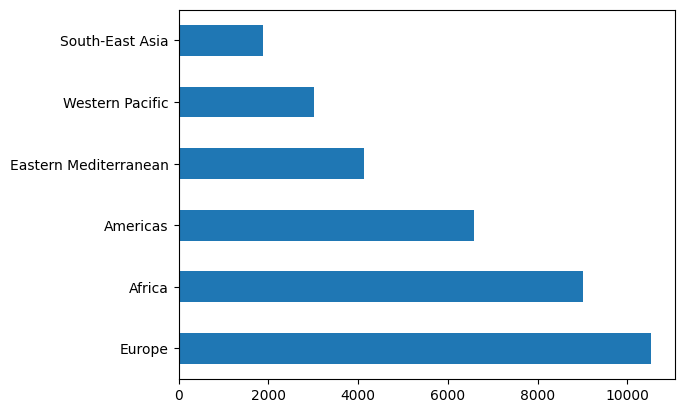

In [18]:
df_1 = pd.read_csv('imports/full_grouped.csv', parse_dates= ['Data'])
df_1['Região WHO'].value_counts().plot(kind='barh')

In [19]:
df_1_limpo = df_1.drop(labels = ['País','Região WHO','Novos Casos','Novas Mortes', 'Novos Recuperados'], axis = 1)
df_1_limpo

,Data,Confirmados,Mortes,Recuperados,Ativos
0,2020-01-22,0,0,0,0
1,2020-01-22,0,0,0,0
2,2020-01-22,0,0,0,0
3,2020-01-22,0,0,0,0
4,2020-01-22,0,0,0,0
...,...,...,...,...,...
35151,2020-07-27,10621,78,3752,6791
35152,2020-07-27,10,1,8,1
35153,2020-07-27,1691,483,833,375
35154,2020-07-27,4552,140,2815,1597


In [20]:
df_1_limpo_novo = df_1_limpo.set_index(df_1_limpo['Data']).drop(labels = 'Data', axis = 1)
df_1_limpo_novo

,Confirmados,Mortes,Recuperados,Ativos
Data,,,,
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
2020-01-22,0,0,0,0
...,...,...,...,...
2020-07-27,10621,78,3752,6791
2020-07-27,10,1,8,1
2020-07-27,1691,483,833,375


In [21]:
lista_datas = []
for i in df_1_limpo_novo.index:
    lista_datas.append(i)
date_set = set(lista_datas)
lista_datas_novo = list(date_set)
len(lista_datas), len(date_set), len(date_set)

(35156, 188, 188)

In [22]:
lista_confirmados = []
lista_ativos = []
lista_mortes = []
lista_recuperados = []
for i in date_set:
    x = df_1_limpo_novo[df_1_limpo_novo.index == i]
    lista_confirmados.append(x['Confirmados'].sum())
for i in date_set:
    x = df_1_limpo_novo[df_1_limpo_novo.index == i]
    lista_ativos.append(x['Ativos'].sum())
for i in date_set:
    x = df_1_limpo_novo[df_1_limpo_novo.index == i]
    lista_mortes.append(x['Ativos'].sum())
for i in date_set:
    x = df_1_limpo_novo[df_1_limpo_novo.index == i]
    lista_recuperados.append(x['Recuperados'].sum())
len(lista_confirmados), len(lista_ativos), len(lista_mortes), len(lista_recuperados)

(188, 188, 188, 188)

In [23]:
novo_df_lista = [date_set, lista_confirmados, lista_ativos, lista_mortes, lista_recuperados]
novo_df = pd.DataFrame(novo_df_lista, index = ['Data', 'Confirmados', 'Ativos', 'Mortes', 'Recuperados'])
novo_df_2 = novo_df.T
novo_df_full = novo_df_2.set_index(novo_df_2['Data']).drop(labels = 'Data', axis = 1).sort_values(by='Data')
novo_df_full

,Confirmados,Ativos,Mortes,Recuperados
Data,,,,
2020-01-22,555,510,510,28
2020-01-23,654,606,606,30
2020-01-24,941,879,879,36
2020-01-25,1434,1353,1353,39
2020-01-26,2118,2010,2010,52
...,...,...,...,...
2020-07-23,15510481,6166006,6166006,8710969
2020-07-24,15791645,6212290,6212290,8939705
2020-07-25,16047190,6243930,6243930,9158743


[Text(0.5, 1.0, 'Casos de Covid - 19 de 22/01/2020 a 27/07/2020'),
 Text(0.5, 0, 'Data'),
 Text(0, 0.5, 'Número de casos de Covid - 19')]

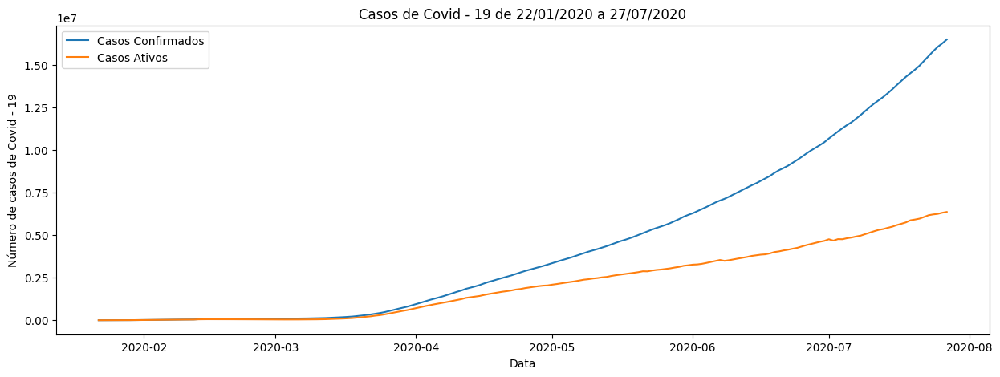

In [24]:
x = novo_df_full.index
y = novo_df_full['Confirmados']
z = novo_df_full['Ativos']
fig, ax = plt.subplots(figsize = (15,5))
ax.plot(x,y,z ,linewidth = 1.5)
ax.legend(['Casos Confirmados','Casos Ativos'])
ax.set(title = "Casos de Covid - 19 de 22/01/2020 a 27/07/2020", xlabel = "Data", ylabel = "Número de casos de Covid - 19")

[Text(0.5, 1.0, 'Casos de Covid - 19 de 22/01/2020 a 27/07/2020'),
 Text(0.5, 0, 'Date'),
 Text(0, 0.5, 'Número de casos de Covid - 19')]

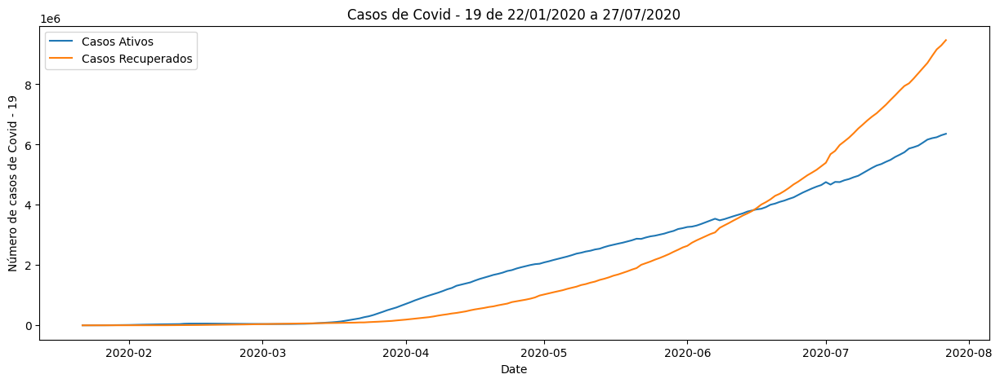

In [25]:
x = novo_df_full.index
y = novo_df_full['Ativos']
z = novo_df_full['Recuperados']
fig, ax = plt.subplots(figsize = (15,5))
ax.plot(x,y,z ,linewidth = 1.5)
ax.legend(['Casos Ativos','Casos Recuperados'])
ax.set(title = "Casos de Covid - 19 de 22/01/2020 a 27/07/2020", xlabel = "Date", ylabel = "Número de casos de Covid - 19")

[Text(0.5, 1.0, 'Casos de Covid - 19 de 22/01/2020 a 27/07/2020'),
 Text(0.5, 0, 'Data'),
 Text(0, 0.5, 'Número de casos de Covid - 19')]

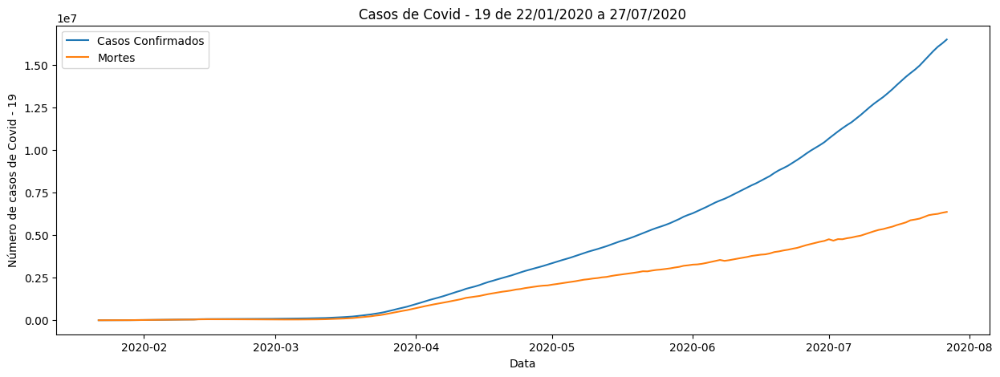

In [26]:
x = novo_df_full.index
y = novo_df_full['Confirmados']
z = novo_df_full['Mortes']
fig, ax = plt.subplots(figsize = (15,5))
ax.plot(x,y,z ,linewidth = 1.5)
ax.legend(['Casos Confirmados','Mortes'])
ax.set(title = "Casos de Covid - 19 de 22/01/2020 a 27/07/2020", xlabel = "Data", ylabel = "Número de casos de Covid - 19")

[Text(0.5, 1.0, 'Casos de Covid - 19 de 22/01/2020 a 27/07/2020'),
 Text(0.5, 0, 'Data'),
 Text(0, 0.5, 'Número de casos de Covid - 19')]

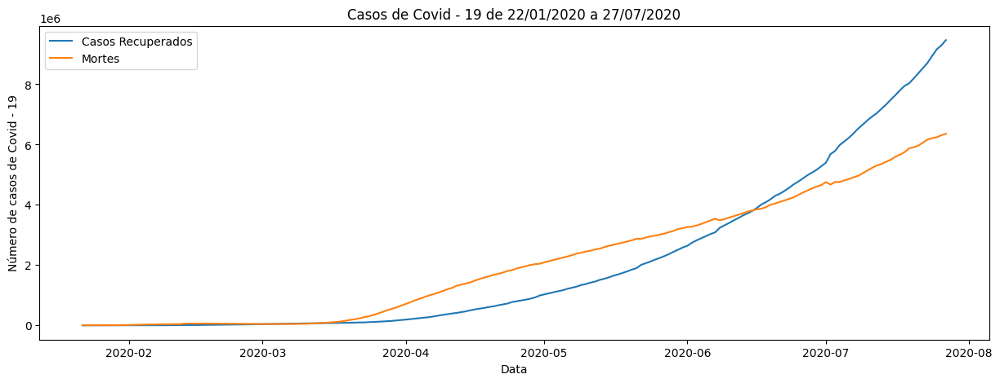

In [27]:
x = novo_df_full.index
y = novo_df_full['Recuperados']
z = novo_df_full['Mortes']
fig, ax = plt.subplots(figsize = (15,5))
ax.plot(x,y,z ,linewidth = 1.5)
ax.legend(['Casos Recuperados','Mortes'])
ax.set(title = "Casos de Covid - 19 de 22/01/2020 a 27/07/2020", xlabel = "Data", ylabel = "Número de casos de Covid - 19")

## Analizando casos em uma base mensal

In [28]:
df_2 = pd.read_csv('imports/full_grouped.csv', parse_dates= ['Data'])
df_novo_2 = df_2.set_index(df_2['Data']).drop(labels = ['Data','País','Região WHO'], axis = 1)
df_novo_modificado_2 = df_novo_2.set_index(df_novo_2.index.strftime('%B'))
df_novo_modificado_2

,Confirmados,Mortes,Recuperados,Ativos,Novos Casos,Novas Mortes,Novos Recuperados
Data,,,,,,,
January,0,0,0,0,0,0,0
January,0,0,0,0,0,0,0
January,0,0,0,0,0,0,0
January,0,0,0,0,0,0,0
January,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...
July,10621,78,3752,6791,152,2,0
July,10,1,8,1,0,0,0
July,1691,483,833,375,10,4,36


In [29]:
lista_meses = []
for i in df_novo_modificado_2.index:
    lista_meses.append(i)
set_meses = set(lista_meses)
set_meses

{'April', 'February', 'January', 'July', 'June', 'March', 'May'}

In [30]:
confirmados_meses_lista = []
mortes_meses_lista = []
recuperados_meses_lista = []
ativos_meses_lista = []
novas_mortes_meses_lista = []
novos_casos_meses_lista = []
novos_recuperados_meses_lista = []
for i in set_meses:
    x = df_novo_modificado_2[df_novo_modificado_2.index == i]
    confirmados_meses_lista.append(x['Confirmados'].sum())
for i in set_meses:
    x = df_novo_modificado_2[df_novo_modificado_2.index == i]
    recuperados_meses_lista.append(x['Recuperados'].sum())
for i in set_meses:
    x = df_novo_modificado_2[df_novo_modificado_2.index == i]
    mortes_meses_lista.append(x['Mortes'].sum())
for i in set_meses:
    x = df_novo_modificado_2[df_novo_modificado_2.index == i]
    ativos_meses_lista.append(x['Ativos'].sum())
for i in set_meses:
    x = df_novo_modificado_2[df_novo_modificado_2.index == i]
    novas_mortes_meses_lista.append(x['Novas Mortes'].sum())
for i in set_meses:
    x = df_novo_modificado_2[df_novo_modificado_2.index == i]
    novos_casos_meses_lista.append(x['Novos Casos'].sum())
for i in set_meses:
    x = df_novo_modificado_2[df_novo_modificado_2.index == i]
    novos_recuperados_meses_lista.append(x['Novos Recuperados'].sum())

In [31]:
nova_lista_modificada = [set_meses,confirmados_meses_lista, mortes_meses_lista, ativos_meses_lista, recuperados_meses_lista, novas_mortes_meses_lista, novos_casos_meses_lista, novos_recuperados_meses_lista] 
df_novo_modificado = (pd.DataFrame(nova_lista_modificada, index = ['Data','Confirmados','Mortes','Ativos','Recuperados','Novas Mortes', 'Novos Casos', 'Novos Recuperados'])).T
df_novo_modificado_1 = df_novo_modificado.set_index(df_novo_modificado['Data']).drop(labels = 'Data', axis = 1)

df_novo_modificado_1

,Confirmados,Mortes,Ativos,Recuperados,Novas Mortes,Novos Casos,Novos Recuperados
Data,,,,,,,
February,1663437,46875,1252893,363669,2723,75379,38095
April,63391662,4311214,43136428,15944020,190226,2412383,815542
June,246525787,13309053,116232466,116984268,137604,4265801,2695870
May,144990399,9609604,82503957,52876838,138902,2921042,1595973
March,9002815,397601,5960842,2644372,41542,786064,135760
July,362895848,15709667,147591957,199594224,142826,6030911,4186628
January,38534,889,36807,838,196,9372,191


<Axes: title={'center': 'Plot de barras de análise mensal do COVID-19 de Janeiro 2020 a Julho 2020'}, xlabel='Meses de Janeiro a Julho/2020', ylabel='Value'>

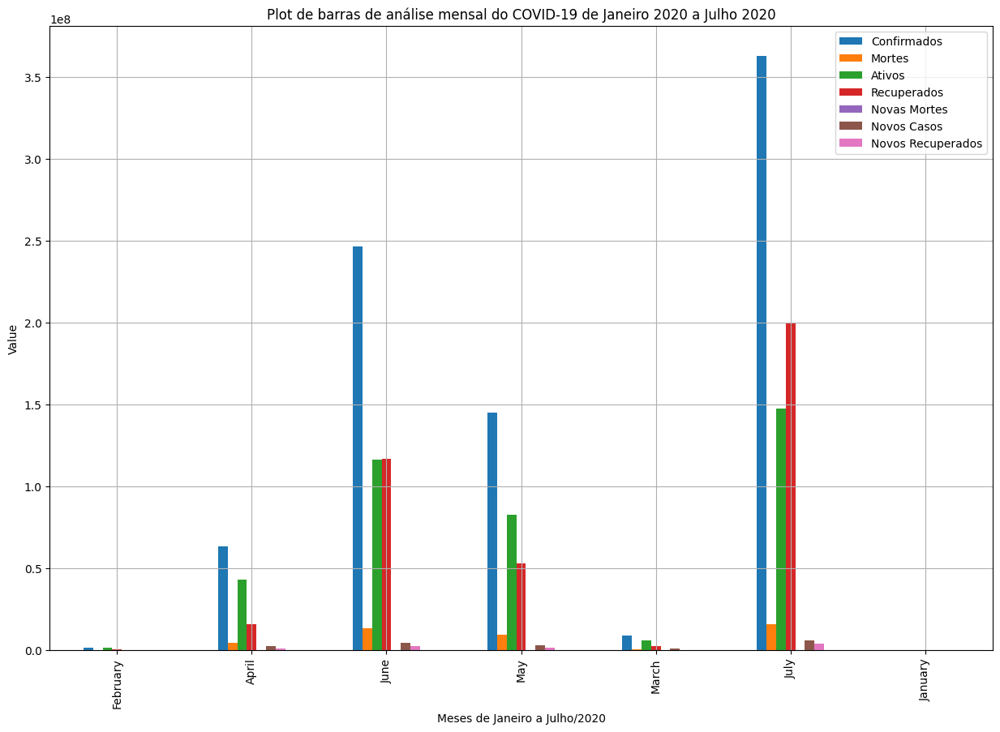

In [32]:
df_novo_modificado_1.plot.bar(figsize = (15,10), grid = True, xlabel = 'Meses de Janeiro a Julho/2020', ylabel = 'Value', title = 'Plot de barras de análise mensal do COVID-19 de Janeiro 2020 a Julho 2020')

<Axes: title={'center': 'Plot de linhas de análise mensal de Covid - 19 dos meses de Janeiro a Julho'}, xlabel='Meses de Janeiro a Julho/2020', ylabel='Value'>

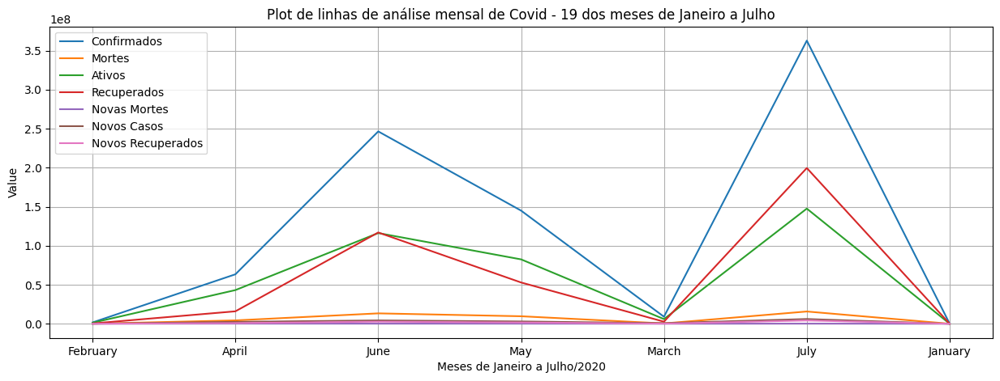

In [33]:
df_novo_modificado_1.plot(figsize = (15,5), grid = True, xlabel = 'Meses de Janeiro a Julho/2020', ylabel = 'Value', title = 'Plot de linhas de análise mensal de Covid - 19 dos meses de Janeiro a Julho')

<Axes: title={'center': 'Plot de barras horizontais de análise mensal de Covid - 19 dos meses de Janeiro a Julho'}, xlabel='Meses de 2020 de Janeiro a Julho', ylabel='Value'>

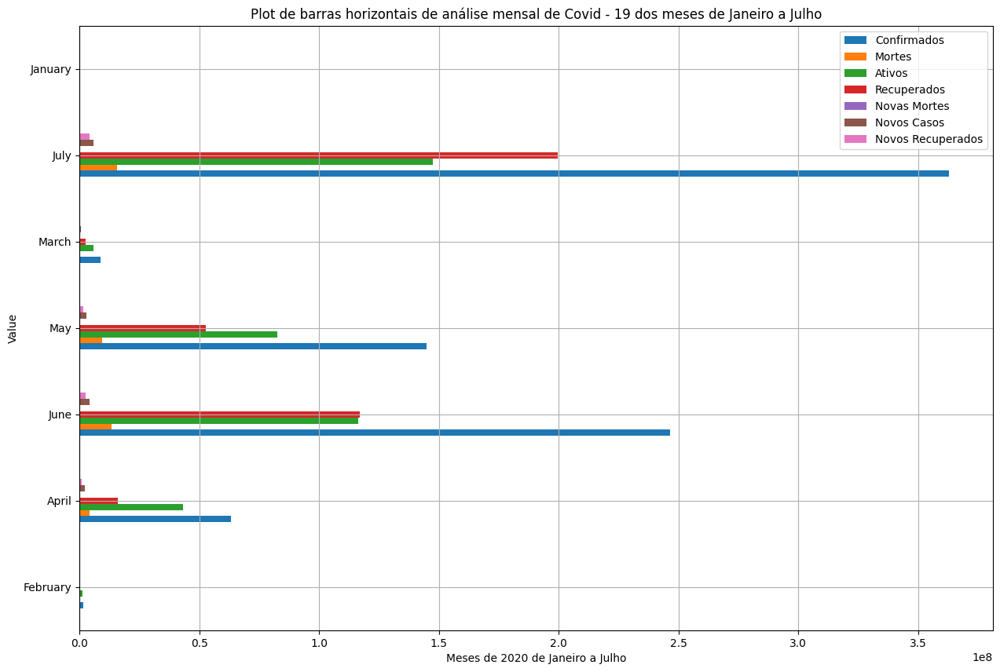

In [34]:
df_novo_modificado_1.plot.barh(figsize = (15,10), grid = True, xlabel = 'Meses de 2020 de Janeiro a Julho', ylabel = 'Value', title = 'Plot de barras horizontais de análise mensal de Covid - 19 dos meses de Janeiro a Julho')

## Analisando outros tipos de casos de 22/01/2020 a 27/07/2020

In [35]:
day_wise_df = pd.read_csv('imports/day_wise.csv', parse_dates = ['Data'])
day_wise_df = day_wise_df.set_index(day_wise_df['Data'])
day_wise_df = day_wise_df.drop(labels = 'Data', axis = 1)
day_wise_df

,Confirmados,Mortes,Recuperados,Ativos,Novos Casos,Novas Mortes,Novos Recuperados,Mortes / 100 Casos,Recuperados / 100 Casos,Mortes / 100 Recuperados,No. de Países
Data,,,,,,,,,,,
2020-01-22,555,17,28,510,0,0,0,3.06,5.05,60.71,6
2020-01-23,654,18,30,606,99,1,2,2.75,4.59,60.00,8
2020-01-24,941,26,36,879,287,8,6,2.76,3.83,72.22,9
2020-01-25,1434,42,39,1353,493,16,3,2.93,2.72,107.69,11
2020-01-26,2118,56,52,2010,684,14,13,2.64,2.46,107.69,13
...,...,...,...,...,...,...,...,...,...,...,...
2020-07-23,15510481,633506,8710969,6166006,282756,9966,169714,4.08,56.16,7.27,187
2020-07-24,15791645,639650,8939705,6212290,281164,6144,228736,4.05,56.61,7.16,187
2020-07-25,16047190,644517,9158743,6243930,255545,4867,219038,4.02,57.07,7.04,187


In [36]:
day_wise_df_simplificado = day_wise_df.iloc[::2]
bcr.bar_chart_race(df=day_wise_df_simplificado,
                              filename=None,
                              orientation='h',
                              sort='desc',
                              n_bars=10,
                              label_bars=True,
                              steps_per_period=10,
                              period_length=500,
                              figsize=(5, 3),
                              cmap='dark24',
                              title='Outros tipos de casos de covid de 22/01/2020 a 27/07/2020',
                              title_size = 9,
                              bar_label_size=7,
                              tick_label_size=7,
                              fig=None)